(324.714, 324.61566, 9.563577)


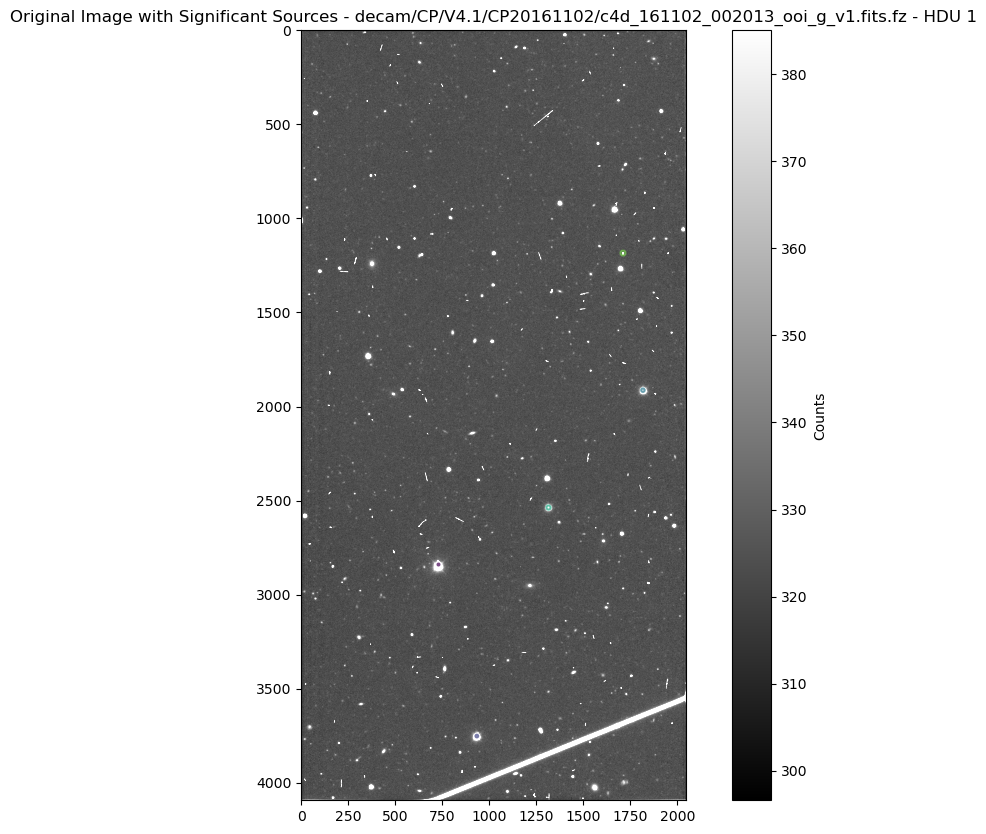

(604.4093, 604.3065, 13.088086)


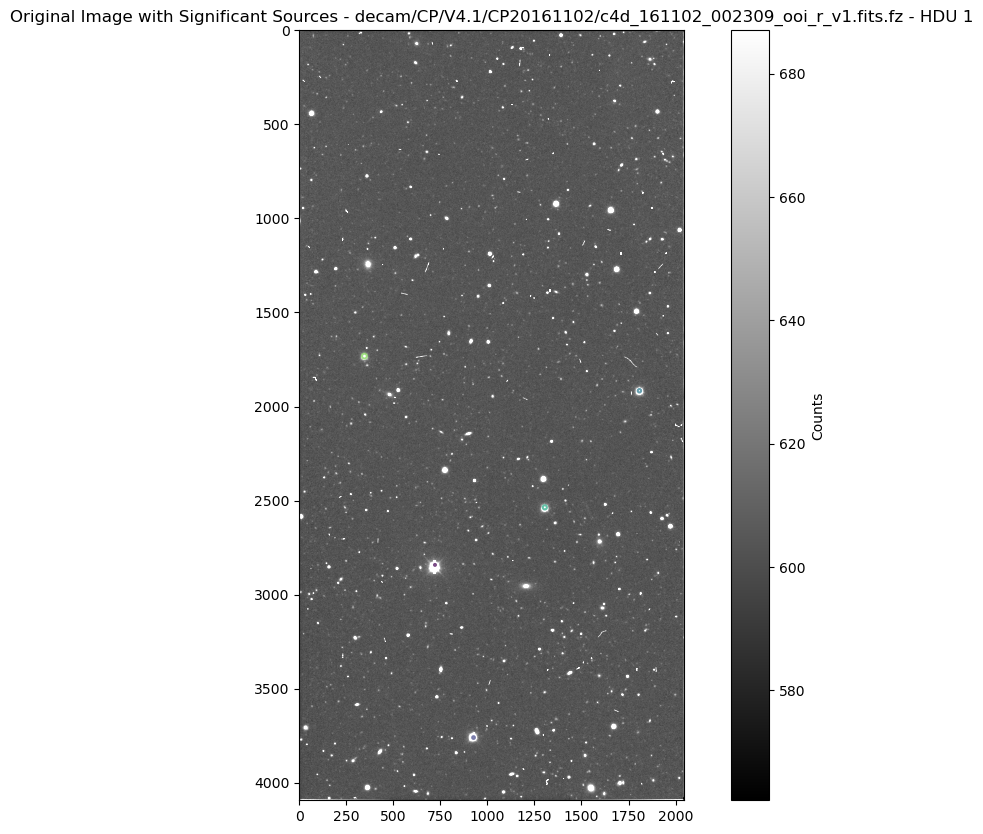

In [1]:
from astropy.io import fits
import os
import matplotlib.pyplot as plt
from astropy.visualization import ZScaleInterval, ImageNormalize
from photutils.background import SExtractorBackground, Background2D
from astropy.stats import SigmaClip, sigma_clipped_stats
from photutils.detection import find_peaks
from photutils.aperture import CircularAperture, aperture_photometry
import numpy as np
from astropy.table import Table

# Constants
THRESHOLD_MULTIPLIER = 100.0 

# File paths
fits_file_path = '/global/cfs/cdirs/desi/users/rongpu/useful/survey-ccds-decam-dr9-trim.fits'
image_base_path = '/global/cfs/cdirs/desicollab/users/brookluo/raw-images/dr9/images'
image_table = Table.read(fits_file_path)

# Background estimation
sigma_clip = SigmaClip(sigma=5.0)
sexbkg = SExtractorBackground(sigma_clip)

for row in image_table[:2]:
    image_filename = row['image_filename']
    image_hdu = row['image_hdu']

    # Create the full path to the image
    image_path = os.path.join(image_base_path, image_filename)

    if not os.path.exists(image_path):
        print(f'File not found: {image_path}')
        continue

    with fits.open(image_path) as hdulist:

        # Display the first HDU (image) with Z-scaled normalization
        image_data = hdulist[image_hdu].data
        mean, median, std = sigma_clipped_stats(image_data, sigma=3.0)
        print((mean, median, std))

        # Background subtraction
        bkg = Background2D(image_data, (60, 60), filter_size=(3, 3), bkg_estimator=sexbkg)
        image_data_subtracted = image_data - bkg.background

        # Find sources using find_peaks
        threshold = median + (THRESHOLD_MULTIPLIER * std)
        box_size = 800 
        tbl = find_peaks(image_data, threshold, box_size=box_size)

        # Get the most significant sources (top 5)
        tbl.sort('peak_value', reverse=True)
        significant_sources = tbl[:5]

        # Loop through significant sources
        for i, source in enumerate(significant_sources):
            x, y = source['x_peak'], source['y_peak']
            aperture_radius = 5.0 + i * 2.0

            # Create a circular aperture
            aperture = CircularAperture((x, y), r=aperture_radius)

        # Plot the original image with the significant sources
        fig, axs = plt.subplots(figsize=(12, 10))
        norm = ImageNormalize(image_data, interval=ZScaleInterval())
        im = axs.imshow(image_data, cmap='gray', norm=norm)

        # Plot circles around the significant sources
        positions = np.transpose((significant_sources['x_peak'], significant_sources['y_peak']))
        for i, (x, y) in enumerate(positions):
            aperture_radius = 5.0 + i * 2.0 
            color = plt.cm.viridis(i / len(positions)) 
            aperture = CircularAperture((x, y), r=aperture_radius)
            aperture.plot(ax=axs, color=color, lw=1.5, alpha=0.7)

        axs.set_title(f'Original Image with Significant Sources - {image_filename} - HDU {image_hdu}')
        fig.colorbar(im, ax=axs, label='Counts')
        plt.show()
        

        

In [2]:
print(significant_sources)

x_peak y_peak peak_value
------ ------ ----------
   721   2842  57646.434
   926   3760   57356.06
  1808   1916  57085.137
  1305   2536  55625.566
   346   1732   54162.92


(324.714, 324.61566, 9.563577)


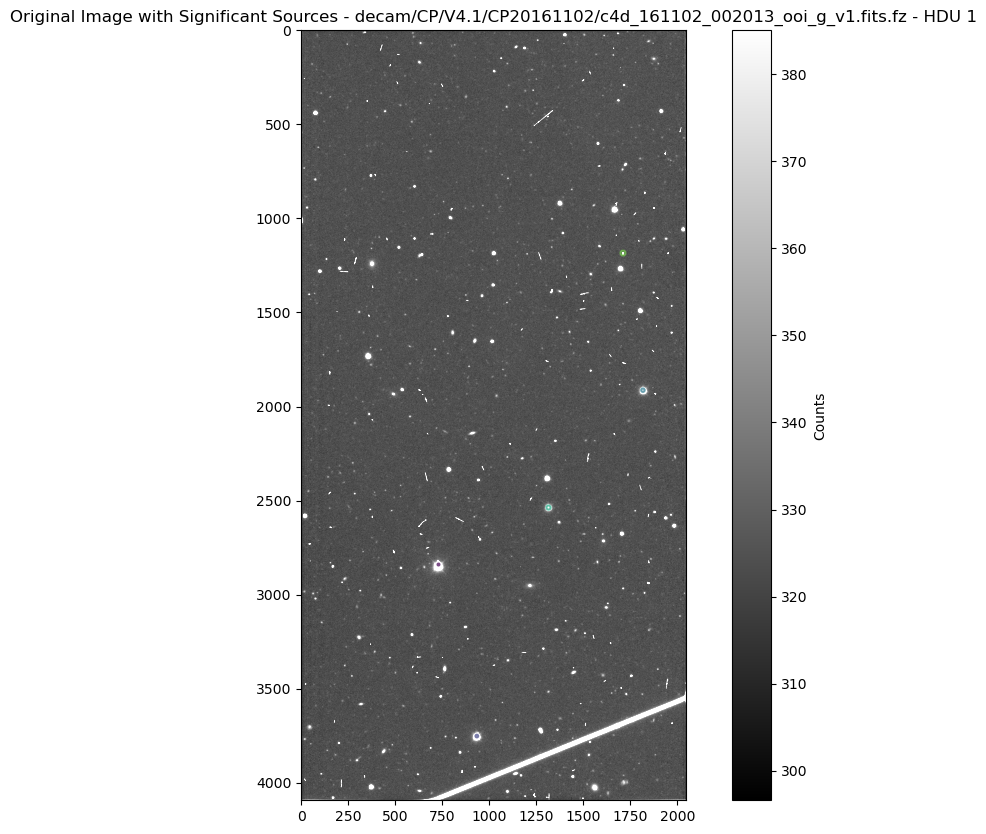

 id   x_fit     y_fit     flux_fit 
--- --------- --------- -----------
  1  730.0036 2840.0165 907275.7841
  2  933.9899 3752.1231 891815.9511
  3 1817.9546 1913.4542 791083.9293
  4 1315.2098 2537.2378 824091.0558
  5 1710.9785 1184.0231 232802.8062
(604.4093, 604.3065, 13.088086)


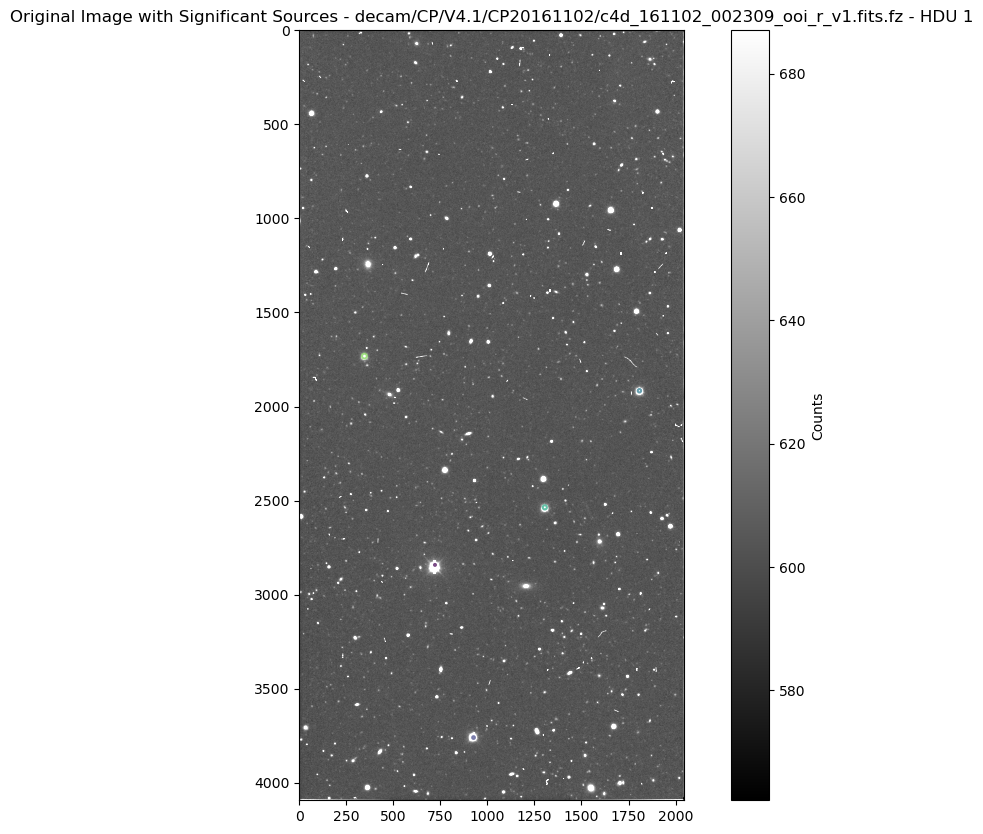

 id   x_fit     y_fit     flux_fit 
--- --------- --------- -----------
  1  721.0026 2842.0143 930323.2375
  2  925.9998 3760.0223 922393.0876
  3 1808.2832 1916.1821 898988.3968
  4 1305.4769 2536.3028 857442.3116
  5  346.5512 1732.6998 769462.4476


In [6]:
from astropy.io import fits
import os
import matplotlib.pyplot as plt
from astropy.visualization import ZScaleInterval, ImageNormalize
from photutils.background import SExtractorBackground, Background2D
from astropy.stats import SigmaClip, sigma_clipped_stats
from photutils.detection import find_peaks
from photutils.aperture import CircularAperture, aperture_photometry
import numpy as np
from astropy.table import Table
from photutils.psf import IntegratedGaussianPRF, PSFPhotometry

# Constants
THRESHOLD_MULTIPLIER = 100.0 

# File paths
fits_file_path = '/global/cfs/cdirs/desi/users/rongpu/useful/survey-ccds-decam-dr9-trim.fits'
image_base_path = '/global/cfs/cdirs/desicollab/users/brookluo/raw-images/dr9/images'
image_table = Table.read(fits_file_path)

# Background estimation
sigma_clip = SigmaClip(sigma=5.0)
sexbkg = SExtractorBackground(sigma_clip)

# Loop through the first 2 rows for display
for row in image_table[:2]:
    image_filename = row['image_filename']
    image_hdu = row['image_hdu']

    # Create the full path to the image
    image_path = os.path.join(image_base_path, image_filename)

    if not os.path.exists(image_path):
        print(f'File not found: {image_path}')
        continue

    with fits.open(image_path) as hdulist:

        # Display the first HDU (image) with Z-scaled normalization
        image_data = hdulist[image_hdu].data
        mean, median, std = sigma_clipped_stats(image_data, sigma=3.0)
        print((mean, median, std))

        # Background subtraction
        bkg = Background2D(image_data, (60, 60), filter_size=(3, 3), bkg_estimator=sexbkg)
        image_data_subtracted = image_data - bkg.background

        # Find sources using find_peaks
        threshold = median + (THRESHOLD_MULTIPLIER * std)
        box_size = 800 
        tbl = find_peaks(image_data, threshold, box_size=box_size)

        # Get the most significant sources (top 5)
        tbl.sort('peak_value', reverse=True)
        significant_sources = tbl[:5]
        

        # Loop through significant sources
        positions = Table()
        positions['x_peak'] = significant_sources['x_peak']
        positions['y_peak'] = significant_sources['y_peak']
        aperture_radius = 4

        apertures = [CircularAperture((x, y), r=aperture_radius) for x, y in positions]

        # Plot the original image with the significant sources
        fig, axs = plt.subplots(figsize=(12, 10))
        norm = ImageNormalize(image_data, interval=ZScaleInterval())
        im = axs.imshow(image_data, cmap='gray', norm=norm)

        # Plot circles around the significant sources
        for i, (x, y) in enumerate(positions):
            aperture_radius = 5.0 + i * 2.0  
            color = plt.cm.viridis(i / len(positions))
            aperture = CircularAperture((x, y), r=aperture_radius)
            aperture.plot(ax=axs, color=color, lw=1.5, alpha=0.7)

        axs.set_title(f'Original Image with Significant Sources - {image_filename} - HDU {image_hdu}')
        fig.colorbar(im, ax=axs, label='Counts')
        plt.show()

        # PSF Photometry
        psf_model = IntegratedGaussianPRF(flux=1, sigma=2.7 / 2.35)
        fit_shape = (5, 5)
        psfphot = PSFPhotometry(psf_model, fit_shape, aperture_radius=aperture_radius)
        result_tab = psfphot(image_data_subtracted,init_params=positions)

        # Display the results
        result_tab['x_fit'].info.format = '.4f'
        result_tab['y_fit'].info.format = '.4f'
        result_tab['flux_fit'].info.format = '.4f'
        print(result_tab[('id', 'x_fit', 'y_fit', 'flux_fit')])


(324.714, 324.61566, 9.563577)


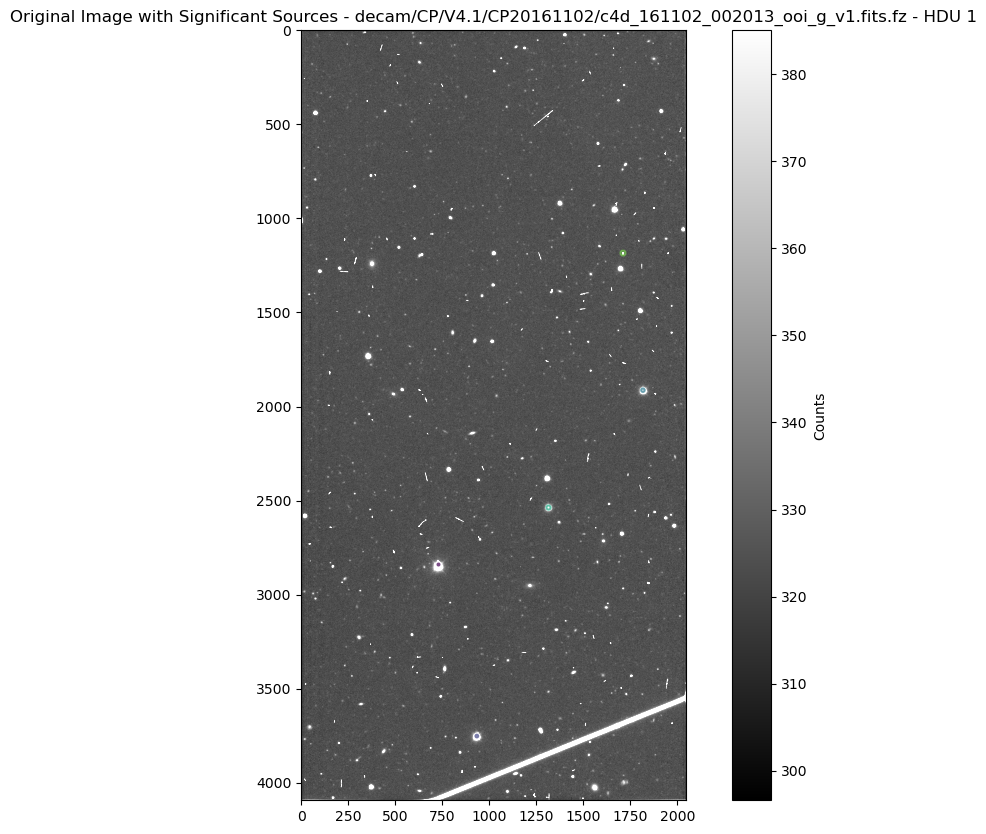

 id   x_fit     y_fit     flux_fit 
--- --------- --------- -----------
  1  730.0036 2840.0165 907275.7841
  2  933.9899 3752.1231 891815.9511
  3 1817.9546 1913.4542 791083.9293
  4 1315.2098 2537.2378 824091.0558
  5 1710.9785 1184.0231 232802.8062
(604.4093, 604.3065, 13.088086)


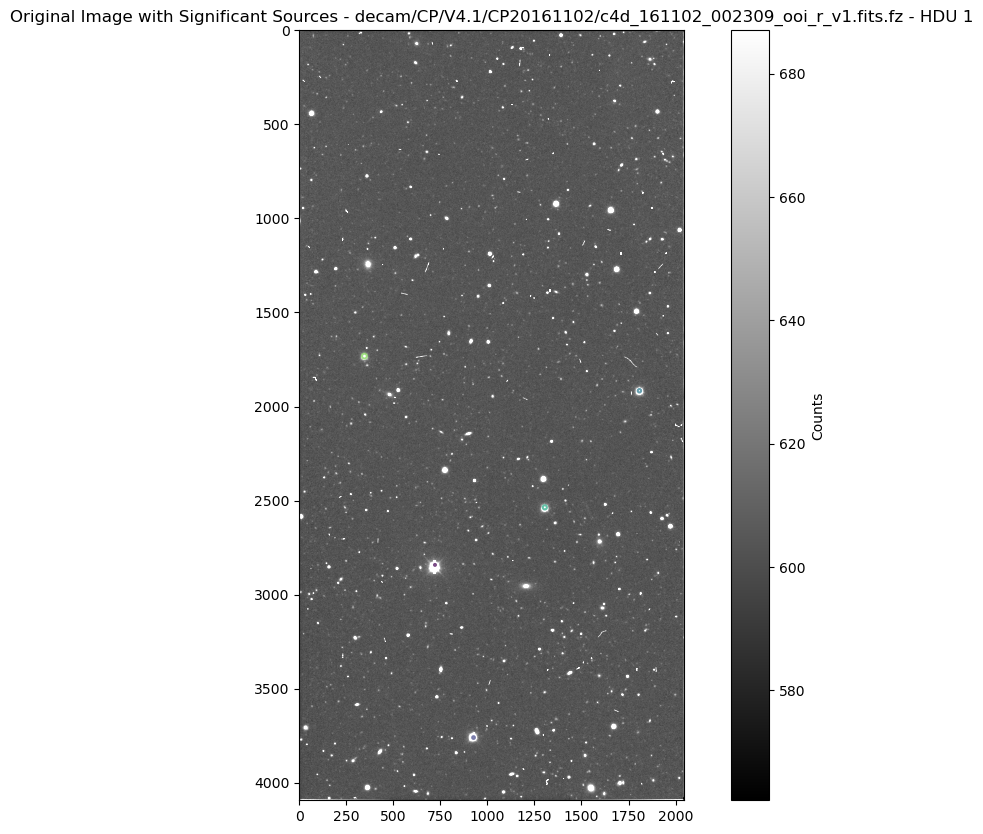

 id   x_fit     y_fit     flux_fit 
--- --------- --------- -----------
  1  721.0026 2842.0143 930323.2375
  2  925.9998 3760.0223 922393.0876
  3 1808.2832 1916.1821 898988.3968
  4 1305.4769 2536.3028 857442.3116
  5  346.5512 1732.6998 769462.4476


In [3]:
from astropy.io import fits
import os
import matplotlib.pyplot as plt
from astropy.visualization import ZScaleInterval, ImageNormalize
from photutils.background import SExtractorBackground, Background2D
from astropy.stats import SigmaClip, sigma_clipped_stats
from photutils.detection import find_peaks
from photutils.aperture import CircularAperture, aperture_photometry
import numpy as np
from astropy.table import Table
from photutils.psf import IntegratedGaussianPRF, PSFPhotometry

# Constants
THRESHOLD_MULTIPLIER = 100.0 

# File paths
fits_file_path = '/global/cfs/cdirs/desi/users/rongpu/useful/survey-ccds-decam-dr9-trim.fits'
image_base_path = '/global/cfs/cdirs/desicollab/users/brookluo/raw-images/dr9/images'
image_table = Table.read(fits_file_path)

# Background estimation
sigma_clip = SigmaClip(sigma=5.0)
sexbkg = SExtractorBackground(sigma_clip)

# Loop through the first 2 rows for display
for row in image_table[:2]:
    image_filename = row['image_filename']
    image_hdu = row['image_hdu']

    # Create the full path to the image
    image_path = os.path.join(image_base_path, image_filename)

    if not os.path.exists(image_path):
        print(f'File not found: {image_path}')
        continue

    with fits.open(image_path) as hdulist:

        # Display the first HDU (image) with Z-scaled normalization
        image_data = hdulist[image_hdu].data
        mean, median, std = sigma_clipped_stats(image_data, sigma=3.0)
        print((mean, median, std))

        # Background subtraction
        bkg = Background2D(image_data, (60, 60), filter_size=(3, 3), bkg_estimator=sexbkg)
        image_data_subtracted = image_data - bkg.background

        # Find sources using find_peaks
        threshold = median + (THRESHOLD_MULTIPLIER * std)
        box_size = 800  # Increase the box size for a larger search region
        tbl = find_peaks(image_data, threshold, box_size=box_size)

        # Get the most significant sources (top 5)
        tbl.sort('peak_value', reverse=True)
        significant_sources = tbl[:5]
        

        # Loop through significant sources
        positions = Table()
        positions['x_peak'] = significant_sources['x_peak']
        positions['y_peak'] = significant_sources['y_peak']
        aperture_radius = 4

        apertures = [CircularAperture((x, y), r=aperture_radius) for x, y in positions]

        # Plot the original image with the significant sources
        fig, axs = plt.subplots(figsize=(12, 10))
        norm = ImageNormalize(image_data, interval=ZScaleInterval())
        im = axs.imshow(image_data, cmap='gray', norm=norm)

        # Plot circles around the significant sources
        for i, (x, y) in enumerate(positions):
            aperture_radius = 5.0 + i * 2.0  # Increase the aperture size for better visibility
            color = plt.cm.viridis(i / len(positions))  # Use different colors for each source
            aperture = CircularAperture((x, y), r=aperture_radius)
            aperture.plot(ax=axs, color=color, lw=1.5, alpha=0.7)

        axs.set_title(f'Original Image with Significant Sources - {image_filename} - HDU {image_hdu}')
        fig.colorbar(im, ax=axs, label='Counts')
        plt.show()

        # PSF Photometry
        psf_model = IntegratedGaussianPRF(flux=1, sigma=2.7 / 2.35)
        fit_shape = (5, 5)
        psfphot = PSFPhotometry(psf_model, fit_shape, aperture_radius=aperture_radius)
        result_tab = psfphot(image_data_subtracted,init_params=positions)

        # Display the results
        result_tab['x_fit'].info.format = '.4f'
        result_tab['y_fit'].info.format = '.4f'
        result_tab['flux_fit'].info.format = '.4f'
        print(result_tab[('id', 'x_fit', 'y_fit', 'flux_fit')])




(324.714, 324.61566, 9.563577)


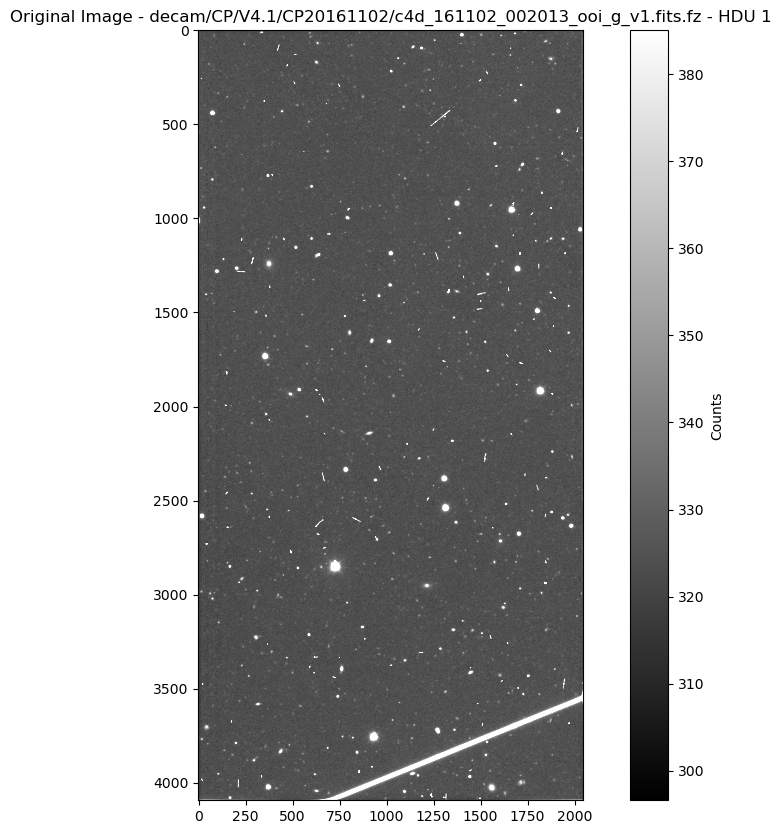

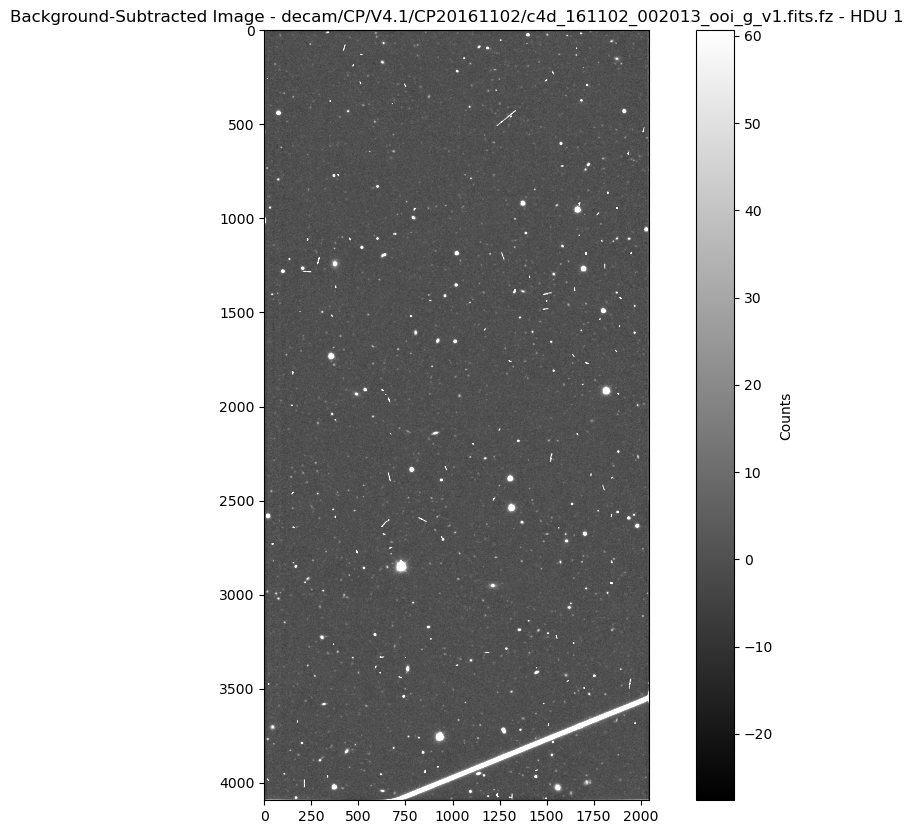

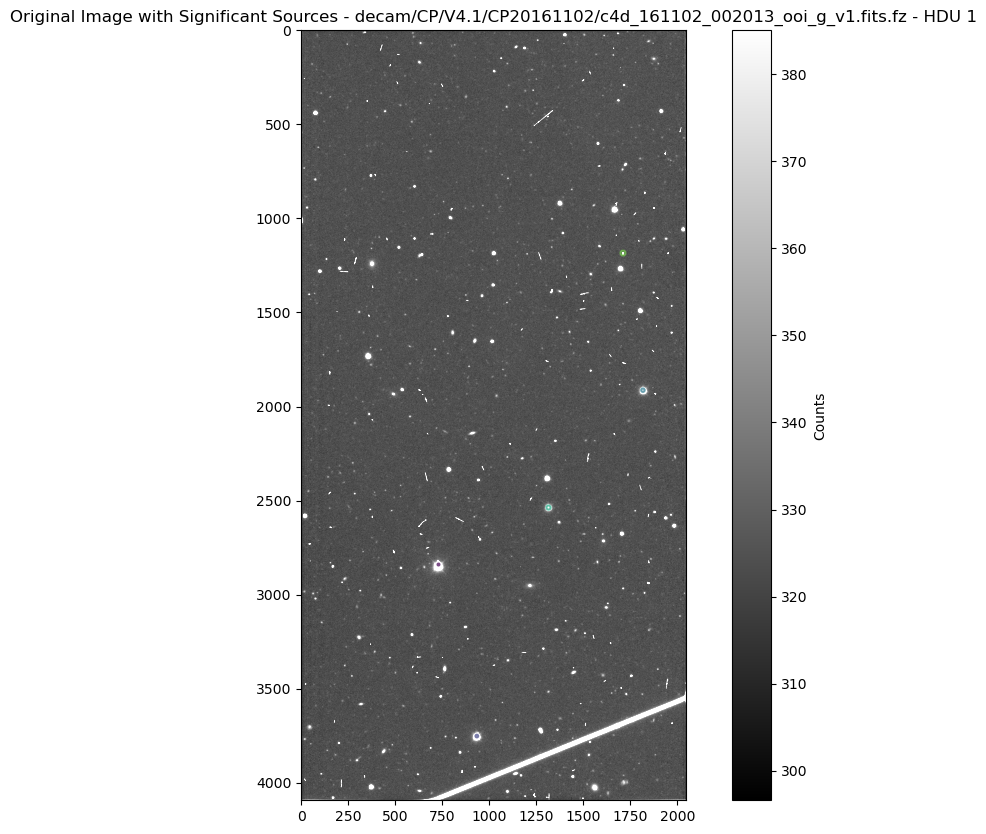

 id   x_fit     y_fit     flux_fit 
--- --------- --------- -----------
  1  730.0036 2840.0165 907275.7841
  2  933.9899 3752.1231 891815.9511
  3 1817.9546 1913.4542 791083.9293
  4 1315.2098 2537.2378 824091.0558
  5 1710.9785 1184.0231 232802.8062


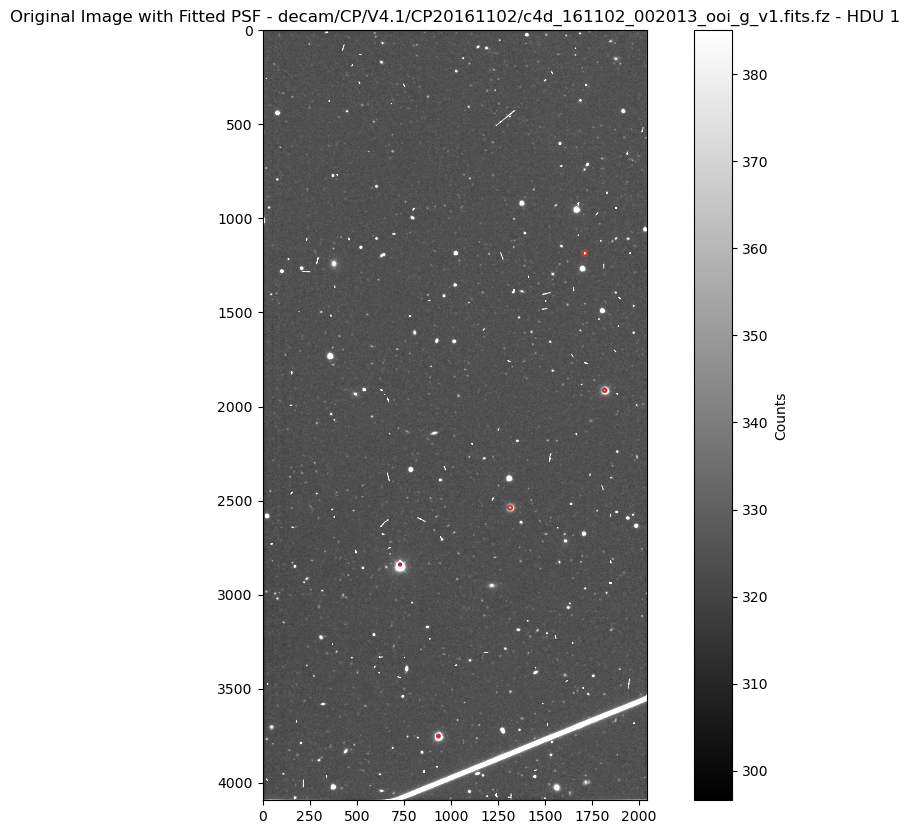

(604.4093, 604.3065, 13.088086)


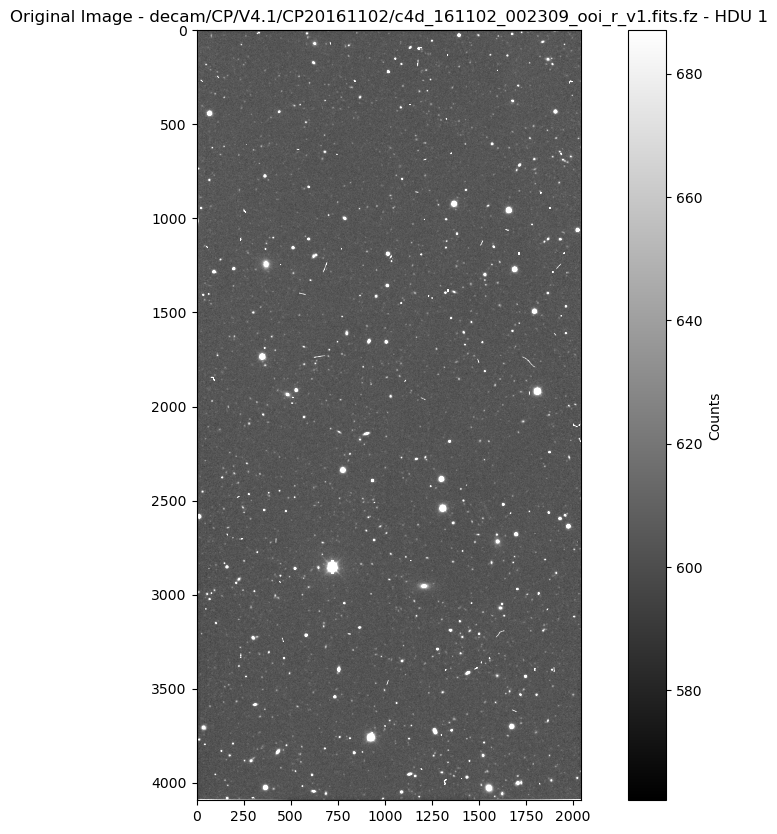

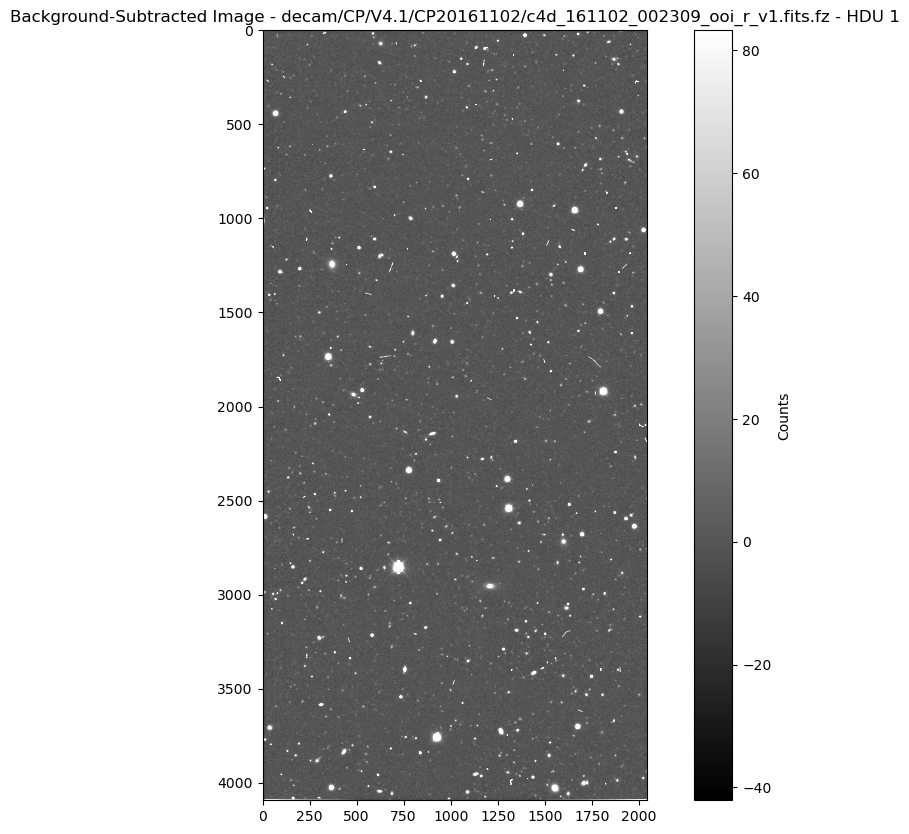

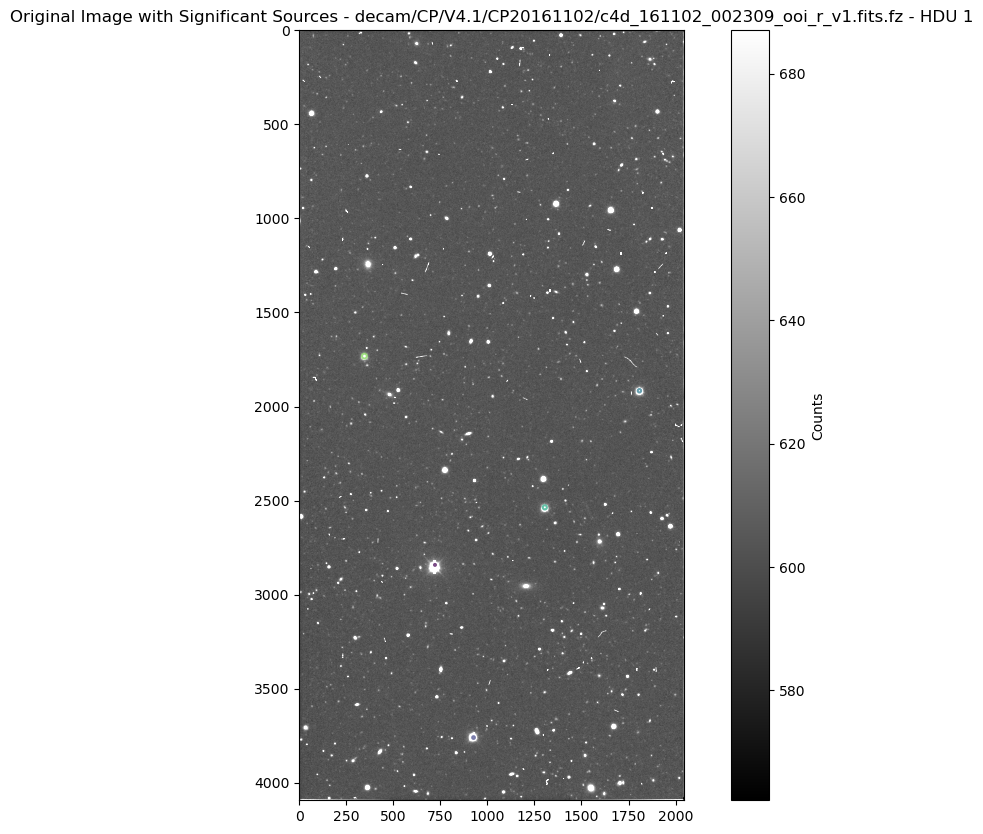

 id   x_fit     y_fit     flux_fit 
--- --------- --------- -----------
  1  721.0026 2842.0143 930323.2375
  2  925.9998 3760.0223 922393.0876
  3 1808.2832 1916.1821 898988.3968
  4 1305.4769 2536.3028 857442.3116
  5  346.5512 1732.6998 769462.4476


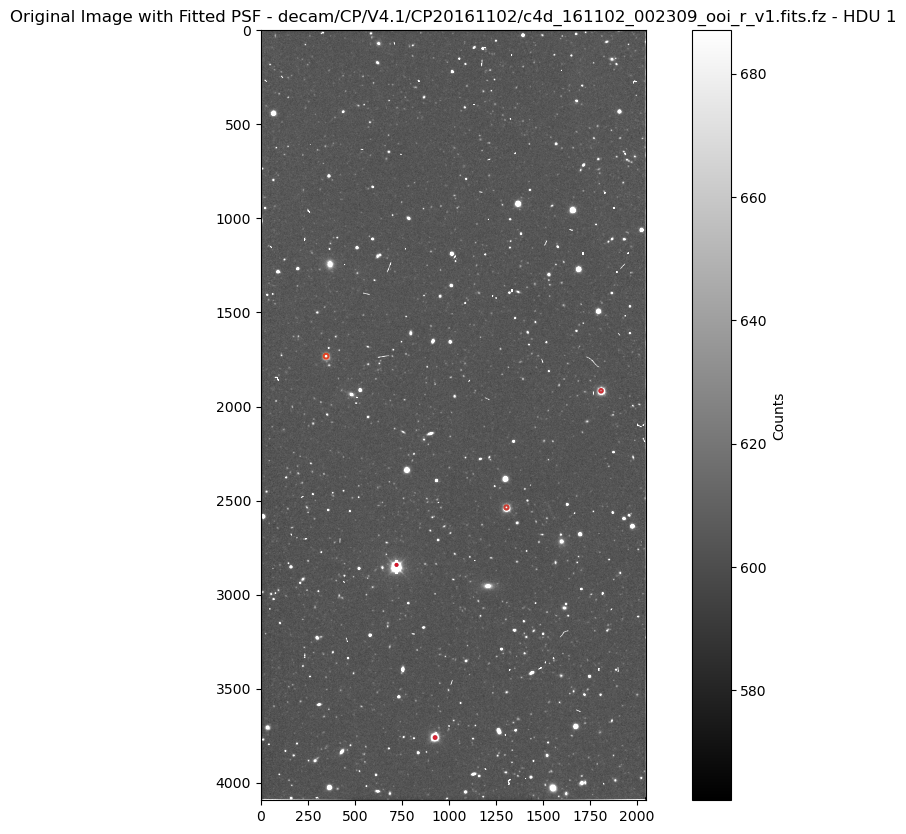

In [1]:
from astropy.io import fits
import os
import matplotlib.pyplot as plt
from astropy.visualization import ZScaleInterval, ImageNormalize
from photutils.background import SExtractorBackground, Background2D
from astropy.stats import SigmaClip, sigma_clipped_stats
from photutils.detection import find_peaks
from photutils.aperture import CircularAperture, aperture_photometry
from astropy.table import Table
from photutils.psf import IntegratedGaussianPRF, PSFPhotometry

# Constants
THRESHOLD_MULTIPLIER = 100.0 

# File paths
fits_file_path = '/global/cfs/cdirs/desi/users/rongpu/useful/survey-ccds-decam-dr9-trim.fits'
image_base_path = '/global/cfs/cdirs/desicollab/users/brookluo/raw-images/dr9/images'
image_table = Table.read(fits_file_path)

# Background estimation
sigma_clip = SigmaClip(sigma=5.0)
sexbkg = SExtractorBackground(sigma_clip)

# Loop through the first 2 rows for display
for row in image_table[:2]:
    image_filename = row['image_filename']
    image_hdu = row['image_hdu']

    # Create the full path to the image
    image_path = os.path.join(image_base_path, image_filename)

    if not os.path.exists(image_path):
        print(f'File not found: {image_path}')
        continue

    with fits.open(image_path) as hdulist:

        # Display the first HDU (image) with Z-scaled normalization
        image_data = hdulist[image_hdu].data
        mean, median, std = sigma_clipped_stats(image_data, sigma=3.0)
        print((mean, median, std))

        # Background subtraction
        bkg = Background2D(image_data, (60, 60), filter_size=(3, 3), bkg_estimator=sexbkg)
        image_data_subtracted = image_data - bkg.background

        # Plot the original image
        fig, axs = plt.subplots(figsize=(12, 10))
        norm = ImageNormalize(image_data, interval=ZScaleInterval())
        im = axs.imshow(image_data, cmap='gray', norm=norm)
        axs.set_title(f'Original Image - {image_filename} - HDU {image_hdu}')
        fig.colorbar(im, ax=axs, label='Counts')
        plt.show()

        # Plot the background-subtracted image
        fig, axs = plt.subplots(figsize=(12, 10))
        norm = ImageNormalize(image_data_subtracted, interval=ZScaleInterval())
        im = axs.imshow(image_data_subtracted, cmap='gray', norm=norm)
        axs.set_title(f'Background-Subtracted Image - {image_filename} - HDU {image_hdu}')
        fig.colorbar(im, ax=axs, label='Counts')
        plt.show()

        # Find sources using find_peaks
        threshold = median + (THRESHOLD_MULTIPLIER * std)
        box_size = 800 
        tbl = find_peaks(image_data, threshold, box_size=box_size)

        # Get the most significant sources (top 5)
        tbl.sort('peak_value', reverse=True)
        significant_sources = tbl[:5]

        # Loop through significant sources
        positions = Table()
        positions['x_peak'] = significant_sources['x_peak']
        positions['y_peak'] = significant_sources['y_peak']
        aperture_radius = 4

        apertures = [CircularAperture((x, y), r=aperture_radius) for x, y in positions]

        # Plot the original image with the significant sources
        fig, axs = plt.subplots(figsize=(12, 10))
        norm = ImageNormalize(image_data, interval=ZScaleInterval())
        im = axs.imshow(image_data, cmap='gray', norm=norm)

        # Plot circles around the significant sources
        for i, (x, y) in enumerate(positions):
            aperture_radius = 5.0 + i * 2.0  
            color = plt.cm.viridis(i / len(positions))  
            aperture = CircularAperture((x, y), r=aperture_radius)
            aperture.plot(ax=axs, color=color, lw=1.5, alpha=0.7)

        axs.set_title(f'Original Image with Significant Sources - {image_filename} - HDU {image_hdu}')
        fig.colorbar(im, ax=axs, label='Counts')
        plt.show()

        # PSF Photometry
        psf_model = IntegratedGaussianPRF(flux=1, sigma=2.7 / 2.35)
        fit_shape = (5, 5)
        psfphot = PSFPhotometry(psf_model, fit_shape, aperture_radius=aperture_radius)
        result_tab = psfphot(image_data_subtracted, init_params=positions)

        # Display the results
        result_tab['x_fit'].info.format = '.4f'
        result_tab['y_fit'].info.format = '.4f'
        result_tab['flux_fit'].info.format = '.4f'
        print(result_tab[('id', 'x_fit', 'y_fit', 'flux_fit')])

        # Plot the fitted PSF on top of the original image
        fig, axs = plt.subplots(figsize=(12, 10))
        norm = ImageNormalize(image_data, interval=ZScaleInterval())
        im = axs.imshow(image_data, cmap='gray', norm=norm)

        # Plot circles around the significant sources
        for i, (x, y) in enumerate(positions):
            aperture_radius = 5.0 + i * 2.0  # Increase the aperture size for better visibility
            color = plt.cm.viridis(i / len(positions))  # Use different colors for each source
            aperture = CircularAperture((x, y), r=aperture_radius)
            aperture.plot(ax=axs, color=color, lw=1.5, alpha=0.7)

        # Plot the fitted PSF on top of the original image
        for i, (x, y) in enumerate(zip(result_tab['x_fit'], result_tab['y_fit'])):
            aperture_radius = 5.0 + i * 2.0  # Adjust the aperture size for visibility
            color = 'red'
            aperture = CircularAperture((x, y), r=aperture_radius)
            aperture.plot(ax=axs, color=color, lw=1.5, alpha=0.7)

        axs.set_title(f'Original Image with Fitted PSF - {image_filename} - HDU {image_hdu}')
        fig.colorbar(im, ax=axs, label='Counts')
        plt.show()


(324.714, 324.61566, 9.563577)


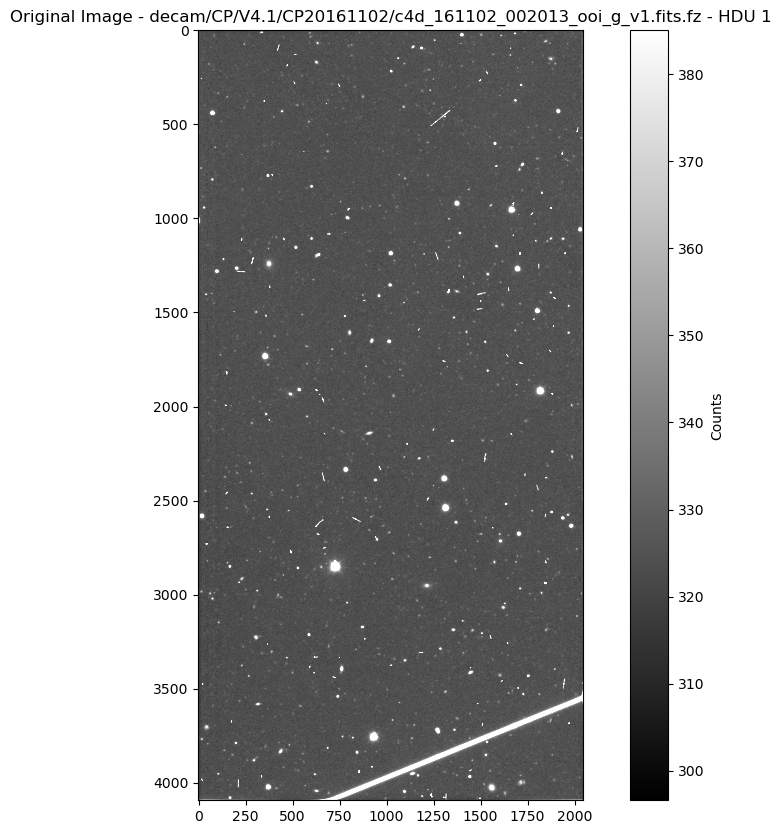

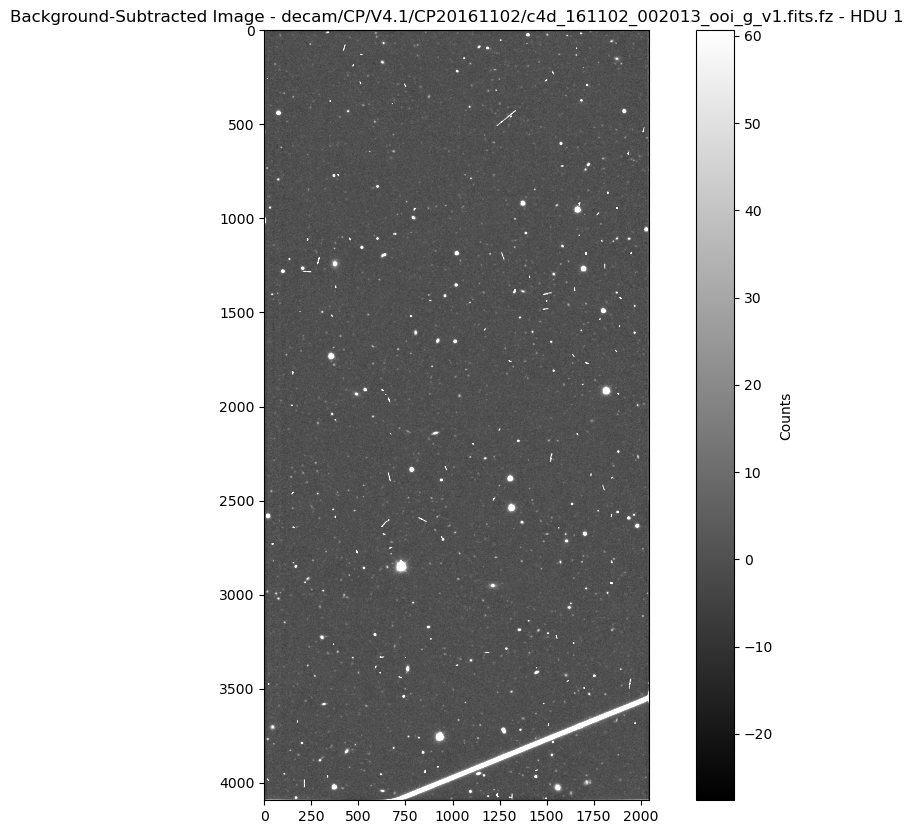

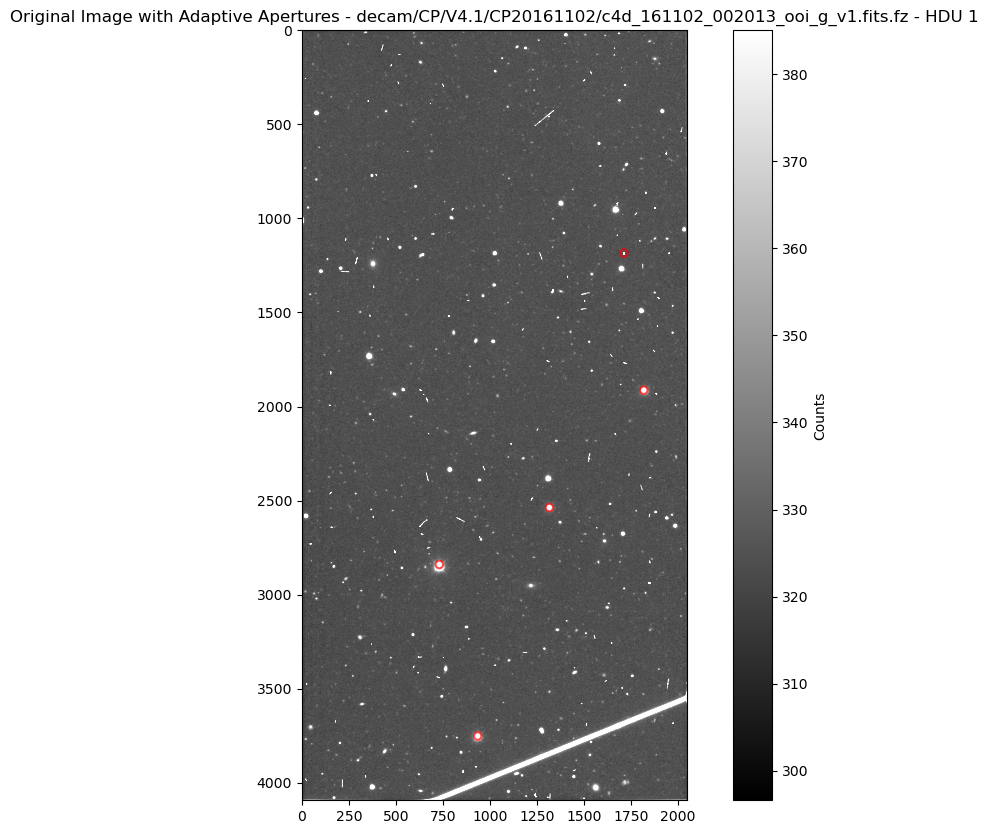

 id   x_fit     y_fit     flux_fit 
--- --------- --------- -----------
  1  730.0030 2840.0135 906905.4144
  2  933.9899 3752.1231 891683.7272
  3 1817.9546 1913.4542 791037.4891
  4 1315.2097 2537.2376 824084.1137
  5 1710.9785 1184.0231 232802.8691


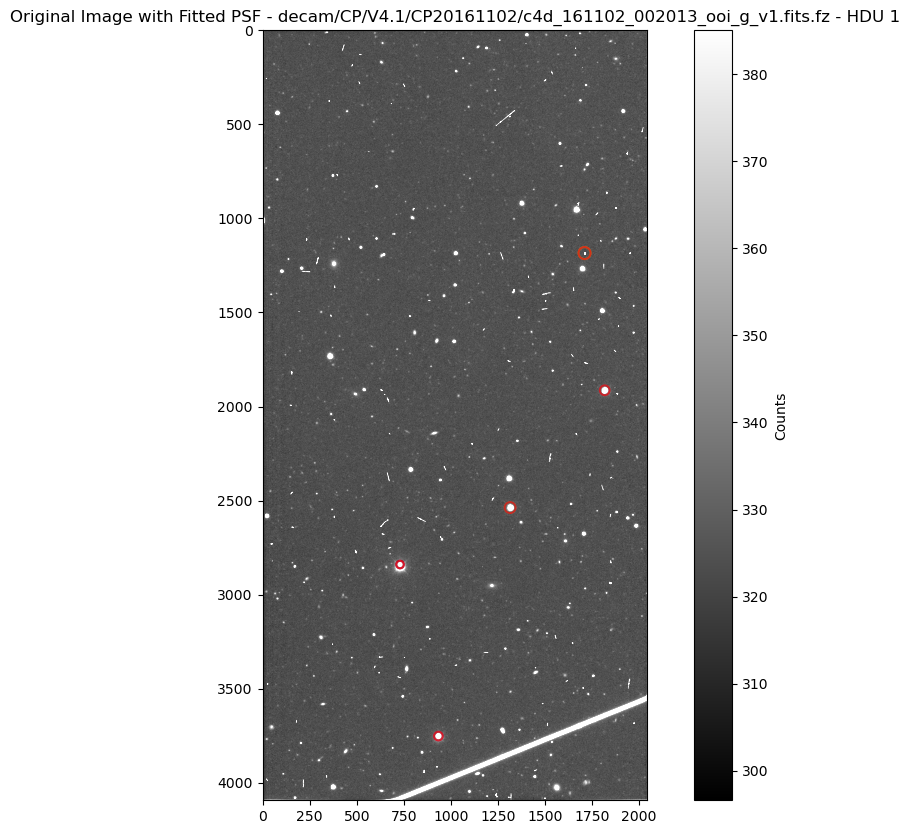

(604.4093, 604.3065, 13.088086)


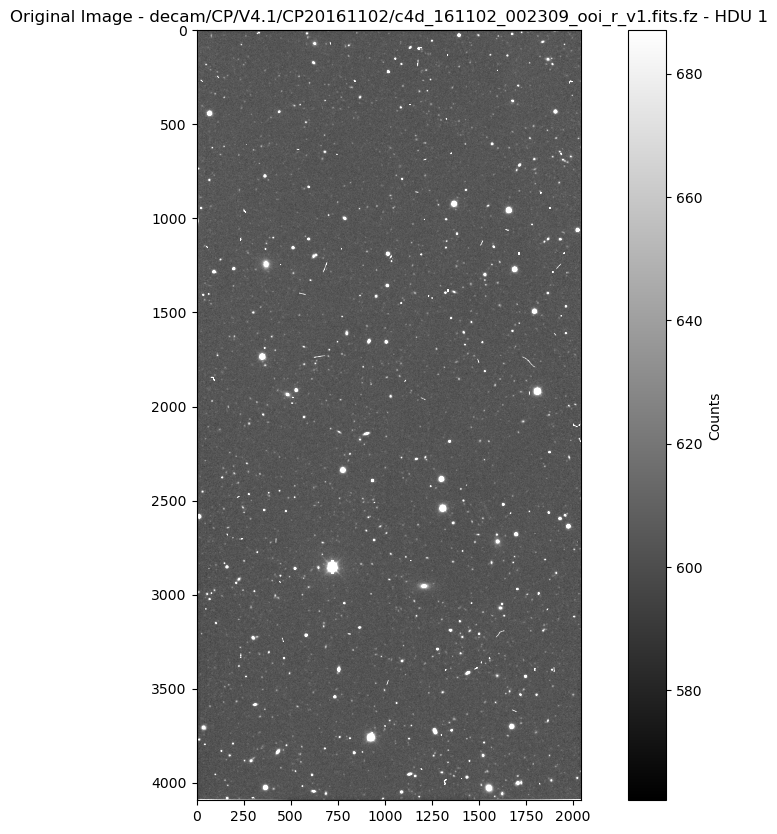

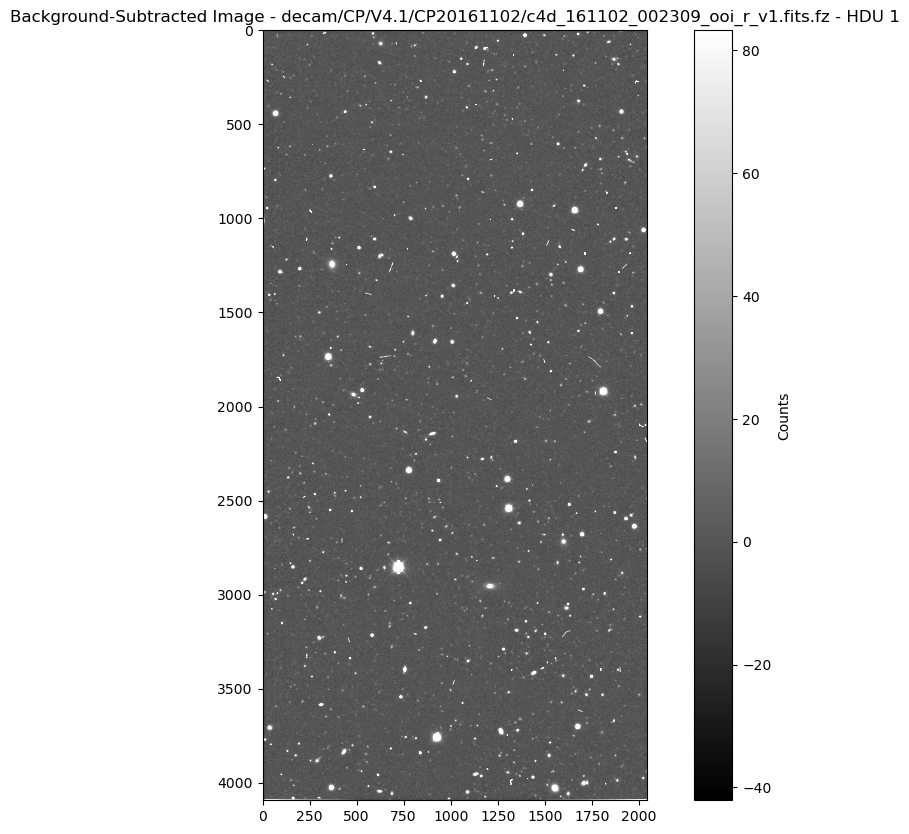

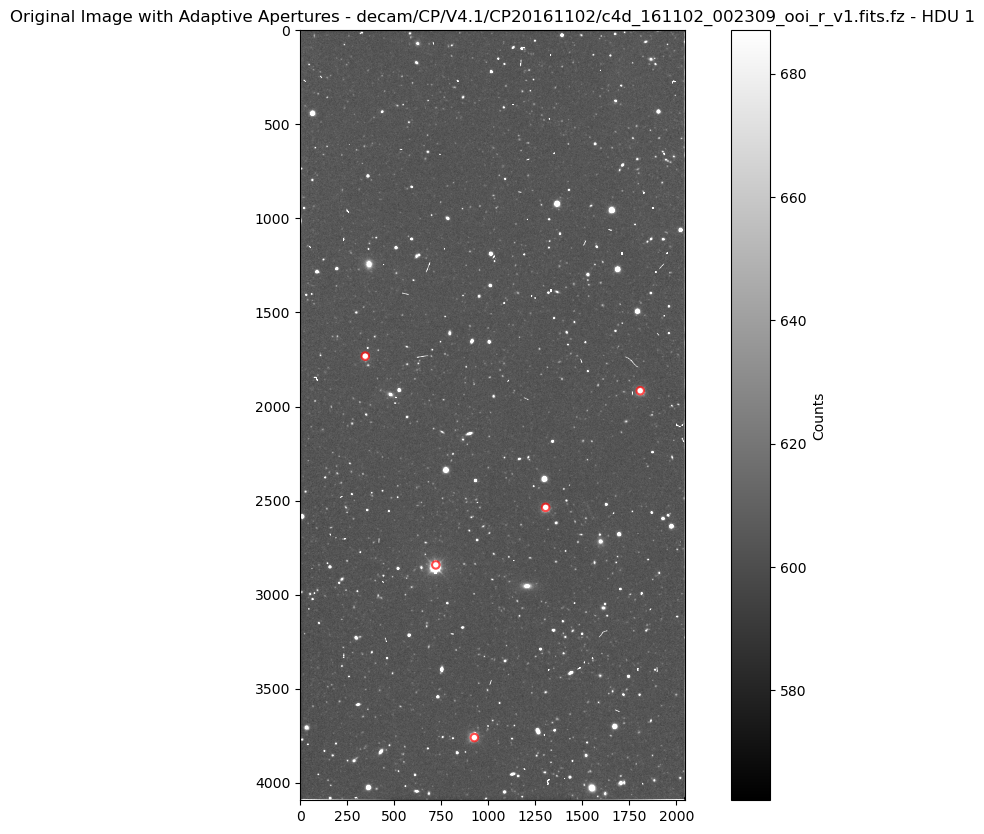

 id   x_fit     y_fit     flux_fit 
--- --------- --------- -----------
  1  721.0021 2842.0116 930050.1210
  2  925.9998 3760.0214 922229.0810
  3 1808.2831 1916.1821 898950.5688
  4 1305.4766 2536.3025 857268.6861
  5  346.5539 1732.7128 770082.3048


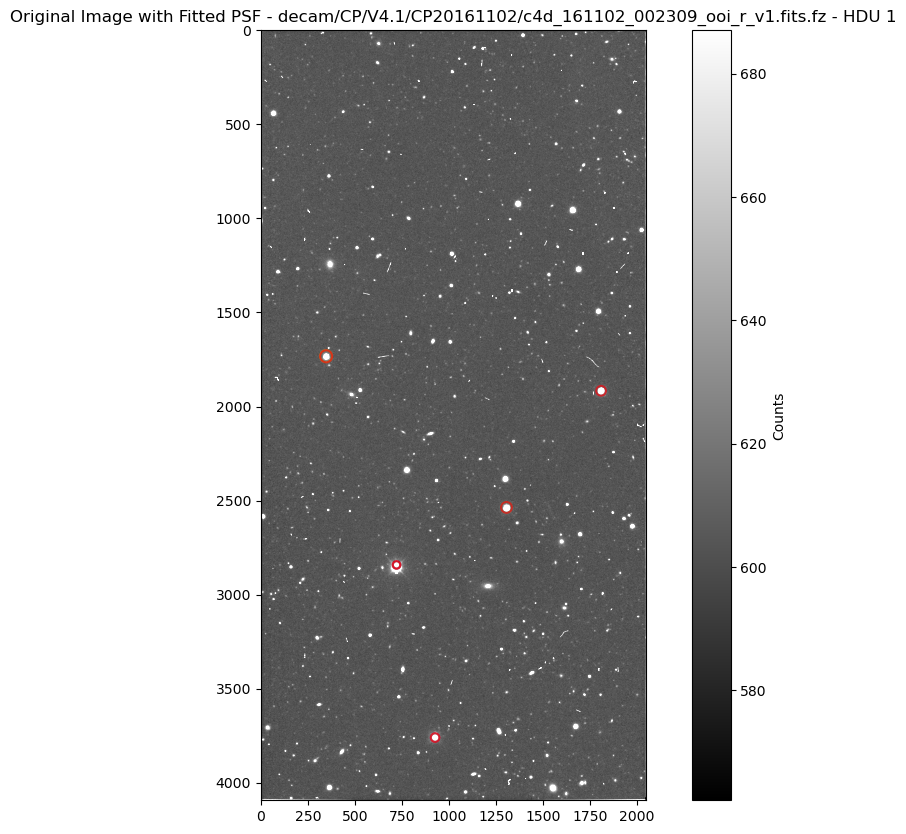

In [20]:
from astropy.io import fits
import os
import matplotlib.pyplot as plt
from astropy.visualization import ZScaleInterval, ImageNormalize
from photutils.background import SExtractorBackground, Background2D
from astropy.stats import SigmaClip, sigma_clipped_stats
from photutils.detection import find_peaks
from photutils.aperture import CircularAperture, aperture_photometry
from astropy.table import Table
from photutils.psf import IntegratedGaussianPRF, PSFPhotometry

# Constants
THRESHOLD_MULTIPLIER = 100.0 

# File paths
fits_file_path = '/global/cfs/cdirs/desi/users/rongpu/useful/survey-ccds-decam-dr9-trim.fits'
image_base_path = '/global/cfs/cdirs/desicollab/users/brookluo/raw-images/dr9/images'
image_table = Table.read(fits_file_path)

# Background estimation
sigma_clip = SigmaClip(sigma=5.0)
sexbkg = SExtractorBackground(sigma_clip)

# Loop through the first 2 rows for display
for row in image_table[:2]:
    image_filename = row['image_filename']
    image_hdu = row['image_hdu']

    # Create the full path to the image
    image_path = os.path.join(image_base_path, image_filename)

    if not os.path.exists(image_path):
        print(f'File not found: {image_path}')
        continue

    with fits.open(image_path) as hdulist:

        # Display the first HDU (image) with Z-scaled normalization
        image_data = hdulist[image_hdu].data
        mean, median, std = sigma_clipped_stats(image_data, sigma=3.0)
        print((mean, median, std))

        # Background subtraction
        bkg = Background2D(image_data, (60, 60), filter_size=(3, 3), bkg_estimator=sexbkg)
        image_data_subtracted = image_data - bkg.background

        # Plot the original image
        fig, axs = plt.subplots(figsize=(12, 10))
        norm = ImageNormalize(image_data, interval=ZScaleInterval())
        im = axs.imshow(image_data, cmap='gray', norm=norm)
        axs.set_title(f'Original Image - {image_filename} - HDU {image_hdu}')
        fig.colorbar(im, ax=axs, label='Counts')
        plt.show()

        # Plot the background-subtracted image
        fig, axs = plt.subplots(figsize=(12, 10))
        norm = ImageNormalize(image_data_subtracted, interval=ZScaleInterval())
        im = axs.imshow(image_data_subtracted, cmap='gray', norm=norm)
        axs.set_title(f'Background-Subtracted Image - {image_filename} - HDU {image_hdu}')
        fig.colorbar(im, ax=axs, label='Counts')
        plt.show()

        # Find sources using detect_sources for more accurate source segmentation
        threshold = median + (THRESHOLD_MULTIPLIER * std)
        tbl = find_peaks(image_data, threshold, box_size=800, wcs=None)

        # Get the most significant sources (top 5)
        tbl.sort('peak_value', reverse=True)
        significant_sources = tbl[:5]

        # Loop through significant sources
        positions = Table()
        positions['x_peak'] = significant_sources['x_peak']
        positions['y_peak'] = significant_sources['y_peak']

        # Adaptive Aperture Photometry
        apertures = []
        for i, (x, y) in enumerate(zip(positions['x_peak'], positions['y_peak'])):
            # Create a circular aperture with a fixed radius for now
            aperture_radius = 20 

            # Create a circular aperture with the fixed radius
            aperture = CircularAperture((x, y), r=aperture_radius)

            # Perform aperture photometry on the background-subtracted image
            phot_table = aperture_photometry(image_data_subtracted, aperture, method='subpixel')

            # Extract the flux from the photometry table
            flux = phot_table['aperture_sum'][0]

            apertures.append(aperture)

        # Plot the original image with the significant sources
        fig, axs = plt.subplots(figsize=(12, 10))
        norm = ImageNormalize(image_data, interval=ZScaleInterval())
        im = axs.imshow(image_data, cmap='gray', norm=norm)

        # Plot adaptive apertures on top of the image
        for aperture in apertures:
            aperture.plot(ax=axs, color='red', lw=1.5, alpha=0.7)

        axs.set_title(f'Original Image with Adaptive Apertures - {image_filename} - HDU {image_hdu}')
        fig.colorbar(im, ax=axs, label='Counts')
        plt.show()

        # PSF Photometry
        psf_model = IntegratedGaussianPRF(flux=1, sigma=2.7 / 2.35)
        fit_shape = (5, 5)
        psfphot = PSFPhotometry(psf_model, fit_shape, aperture_radius=aperture_radius)
        result_tab = psfphot(image_data_subtracted, init_params=positions)

        # Display the results
        result_tab['x_fit'].info.format = '.4f'
        result_tab['y_fit'].info.format = '.4f'
        result_tab['flux_fit'].info.format = '.4f'
        print(result_tab[('id', 'x_fit', 'y_fit', 'flux_fit')])

        # Plot the fitted PSF on top of the original image
        fig, axs = plt.subplots(figsize=(12, 10))
        norm = ImageNormalize(image_data, interval=ZScaleInterval())
        im = axs.imshow(image_data, cmap='gray', norm=norm)

        # Plot circles around the significant sources
        for i, (x, y) in enumerate(positions):
            aperture_radius = 20.0 + i * 3.0 
            color = plt.cm.viridis(i / len(positions)) 
            aperture = CircularAperture((x, y), r=aperture_radius)
            aperture.plot(ax=axs, color=color, lw=1.5, alpha=0.7)

        # Plot the fitted PSF on top of the original image
        for i, (x, y) in enumerate(zip(result_tab['x_fit'], result_tab['y_fit'])):
            aperture_radius = 20.0 + i * 3.0  
            color = 'red'
            aperture = CircularAperture((x, y), r=aperture_radius)
            aperture.plot(ax=axs, color=color, lw=1.5, alpha=0.7)

        axs.set_title(f'Original Image with Fitted PSF - {image_filename} - HDU {image_hdu}')
        fig.colorbar(im, ax=axs, label='Counts')
        plt.show()
